# Práctica 2 #



## Imports ##

In [ ]:
!pip install lime shap

import sys
import os
import pathlib
import math
import numpy as np; print(f'Versión de Numpy: {np.__version__}')
import pandas as pd; print(f'Versión de Pandas: {pd.__version__}')
import matplotlib as mpl; print(f'Versión de MatPlotLib: {mpl.__version__}')
import sklearn as sk; print(f'Versión de ScikitLearn: {sk.__version__}')
import tensorflow as tf; #print(f'Versión de TensorFlow: {tf.__version__}')
import tensorflow.python.keras as tfk; #print(f'Versión de Keras: {tfk.__version__}')
import google.colab as gc; print(f'Version de Google Colab: {gc.__version__}')
import lime
import lime.lime_tabular
import shap


from pathlib import Path
from math import ceil
from numpy import abs, logical_and, nan
from pandas import read_csv, DataFrame, get_dummies
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from google.colab import drive
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from lime.lime_tabular import LimeTabularExplainer
from shap import sample, KernelExplainer, summary_plot, dependence_plot, force_plot, decision_plot


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 24.5 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=0a01236da5175798ed085d5623c3b1726c20b4353d4bd6c8ab2e527011708daf
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
Versión de Numpy: 1.23.5
Versión de Pandas: 1.5.3
Versión de MatPlotLib: 3.7.1
Versión de ScikitLearn: 1.2.2
Version de Google Colab: 0.0.1a2


## Data ##

### Read cleaned dataset ###

In [ ]:
# Importar dataset
dataset = pd.read_csv('student-mat.csv', sep=';', decimal='.')

dataset = dataset.dropna()

pd.DataFrame(dataset).to_csv("normales.csv")

# Separa las características (X) de las etiquetas objetivo (y)
X=dataset.drop(columns=['G3'])  # X contiene todas las características
Y_G3=dataset['G3']  # y contiene las etiquetas objetivo

# Definir las columnas
columnas_categoricas=['school', 'sex', 'address', 'famsize', 'Pstatus', 'Mjob', 'Fjob', 'guardian', 'schoolsup', 'famsup', 'paid', 'higher',  'internet',  'romantic', 'activities', 'nursery', 'reason']

# Aplicar One-Hot Encoding - Entrena mejor con ellos
X=pd.get_dummies(X, columns=columnas_categoricas)

# Pasar a float
X = X.astype(float)

# Crear una instancia del escalador
scaler=MinMaxScaler()

# Aplicar la normalización Min-Max a todas las características
X_normalized=scaler.fit_transform(X)

# Crear un nuevo DataFrame con las características normalizadas
X_normalized_df=pd.DataFrame(X_normalized, columns=X.columns)

# Visualizar el DataFrame que se va a utilizar para el entrenamiento de los modelos
print(X_normalized_df)

# Determinar que caracteristicas son las mas importantes
# Crear un modelo base
estimator=LinearRegression()

# Crear un selector RFE
selector=RFE(estimator, n_features_to_select=28)  # Elige el número de características deseadas

# Ajustar el selector a los datos
selector.fit(X_normalized_df, Y_G3)

# Obtener las características seleccionadas
selected_features=X_normalized_df.columns[selector.support_]

#print("Características seleccionadas por RFE:")
print(selected_features)

# Crear un nuevo DataFrame con las características seleccionadas
#X=X_normalized_df[selected_features]
X = X_normalized_df

# Guardar el nuevo DataFrame en un archivo CSV
#X.to_csv("datos_con_selected_features.csv", index=False)
pd.DataFrame(X_normalized).to_csv("datos_con_selected_features.csv")

# Configuración
train_ratio = 0.90
validation_ratio = 0.025
test_ratio = 0.075

# Dividir los datos en entranamiento y test
y = Y_G3
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1 - train_ratio, random_state=4)

# Validacion
X_Val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=test_ratio/(test_ratio + validation_ratio), shuffle=True, random_state=1)

          age  Medu  Fedu  traveltime  studytime  failures  famrel  freetime  \
0    0.428571  1.00  1.00    0.333333   0.333333  0.000000    0.75      0.50   
1    0.285714  0.25  0.25    0.000000   0.333333  0.000000    1.00      0.50   
2    0.000000  0.25  0.25    0.000000   0.333333  1.000000    0.75      0.50   
3    0.000000  1.00  0.50    0.000000   0.666667  0.000000    0.50      0.25   
4    0.142857  0.75  0.75    0.000000   0.333333  0.000000    0.75      0.50   
..        ...   ...   ...         ...        ...       ...     ...       ...   
390  0.714286  0.50  0.50    0.000000   0.333333  0.666667    1.00      1.00   
391  0.285714  0.75  0.25    0.333333   0.000000  0.000000    0.25      0.75   
392  0.857143  0.25  0.25    0.000000   0.000000  1.000000    1.00      1.00   
393  0.428571  0.75  0.50    0.666667   0.000000  0.000000    0.75      0.75   
394  0.571429  0.25  0.25    0.000000   0.000000  0.000000    0.50      0.25   

     goout  Dalc  ...  romantic_no  rom

## Expert System (ES)

### Machine Learning (ML) ###

#### Model ####

In [ ]:
# Entrenar el modelo
model_linear = LinearRegression()
model_linear.fit(X_train, y_train)

# Evaluar el modelo
y_pred = model_linear.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'MSE on Test Set: {mse}')
print(f'RMSE on Test Set: {np.sqrt(mse)}')

MSE on Test Set: 3.187369791666667
RMSE on Test Set: 1.7853206411361144


In [ ]:
from xgboost import XGBRegressor

# Entrenar el modelo
model_xgb = XGBRegressor()

model_xgb.fit(X_train, y_train)

# Evaluar el modelo
y_pred = model_xgb.predict(X_test)
xgb_mse = mean_squared_error(y_test, y_pred)
print(f'MSE on Test Set: {xgb_mse}')
print(f'RMSE on Test Set: {np.sqrt(xgb_mse)}')

MSE on Test Set: 0.6090141579614362
RMSE on Test Set: 0.7803935916968028


In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

# Definir los parámetros
param_grid = {
    'C': [0.1, 1, 2, 100, 200],
    'epsilon': [0.1, 0.2, 0.5, 1],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto']
}

# Crear el modelo
svr = SVR(kernel='linear')

# Usar GridSearchCV para buscar los mejores hiperparámetros
grid_search = GridSearchCV(svr, param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

# Coger los mejores
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Entrenar el modelo con los mejores parámetros
best_svr_model = SVR(**best_params)
best_svr_model.fit(X_train, y_train)

# Evaluar el modelo
predictions_svr = best_svr_model.predict(X_test)
mse_svr = mean_squared_error(y_test, predictions_svr)
r2_svr = r2_score(y_test, predictions_svr)
print(f'\nMSE (SVR): {mse_svr}')
print(f'RMSE on Test Set: {np.sqrt(mse_svr)}')
print(f'R-squared (SVR): {r2_svr}')

Best Hyperparameters: {'C': 200, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'linear'}

MSE (SVR): 4.058891850730871
RMSE on Test Set: 2.0146691665707475
R-squared (SVR): 0.7838587855358983


#### Interpretation ####

##### LIME #####

Explicación de LIME:


*   Color más intenso -> Mayor contribución
*   Número asociado a cada característica -> Representa cuánto afecta esa característica a la predicción




In [ ]:
# Linear Regression
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)
X = pd.DataFrame(X)

explainer_linear = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', training_labels=y_train.values, feature_names = X.columns.values.tolist())
exp_linear = explainer_linear.explain_instance(X_test.iloc[0].values, model_linear.predict)
print("LIME Explanation (Linear Regression):")
print(exp_linear.show_in_notebook())

LIME Explanation (Linear Regression):


X does not have valid feature names, but LinearRegression was fitted with feature names


None


En este caso, LIME nos indica que las características que mas contribuyen son REPUTACION, CURSO y OTRAS, mientras que ESTUDIAR EN CASA y SEXO MASCULINO son las que menos.

In [ ]:
# XGBRegressor
explainer_xgb = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', training_labels=y_train.values, feature_names=X.columns.values.tolist())
exp_xgb = explainer_xgb.explain_instance(X_test.iloc[0].values, model_xgb.predict)
print("LIME Explanation (XGBRegressor):")
print(exp_xgb.show_in_notebook())

LIME Explanation (XGBRegressor):


None


En este caso, LIME nos indica que las características que mas contribuyen son G2, G1, mientras que el ABSENTISMO y TRABAJO DE LA MADRE son las que menos.

In [ ]:
# SVR
explainer_svr = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', training_labels=y_train.values, feature_names=X.columns.values.tolist())
exp_svr = explainer_svr.explain_instance(X_test.iloc[0].values, best_svr_model.predict)
print("LIME Explanation (SVR):")
print(exp_svr.show_in_notebook())


LIME Explanation (SVR):


X does not have valid feature names, but SVR was fitted with feature names


None


En este caso, LIME nos indica que las características que mas contribuyen son G2, TRABAJO DEL PADRE, mientras que TRABAJO DE LA MADRE y si LOS PADRES VIVEN JUNTOS son las que menos.

##### SHAP #####

* Valor base -> Valor esperado cuando no se espera ninguna característica
* Contribución SHAP -> Cuánto cambia el valor de salida del modelo debido a la presencia de una característica concreta
* Valores SHAP:
  - Cada punto = una instancia
  - Están asociados a cada característica
  - Contribución positiva - Rojo
  - Contribución negativa - Azul
  - Contribución más fuerte - Color más intenso


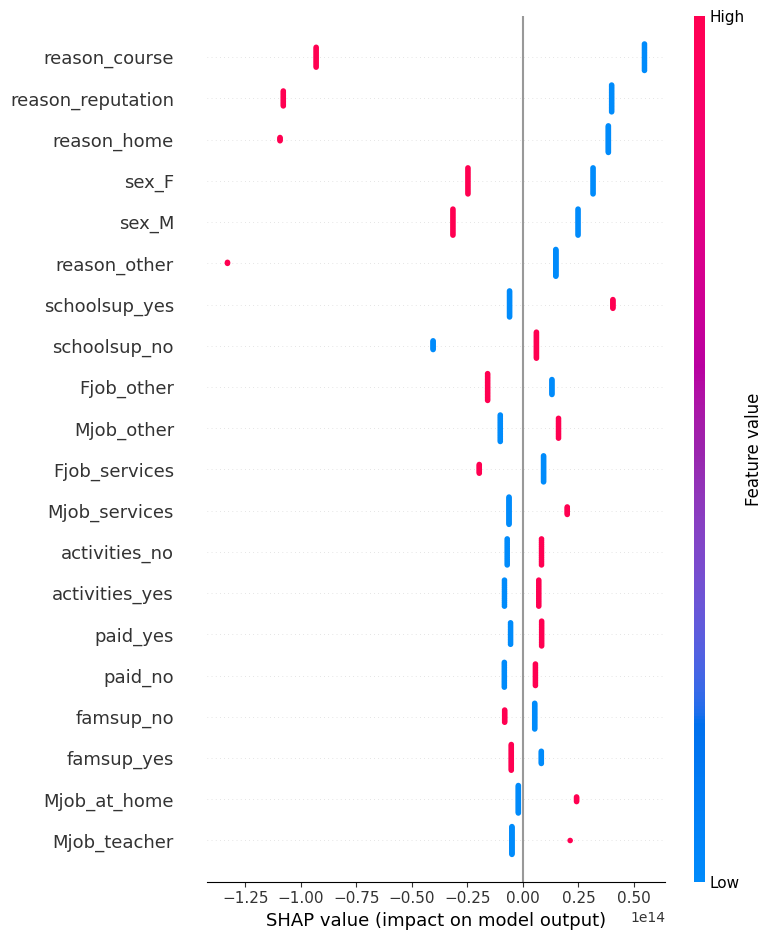

In [ ]:
# Linear Regression
explainer_shap = shap.Explainer(model_linear.predict, X_train)
shap_values = explainer_shap.shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns)

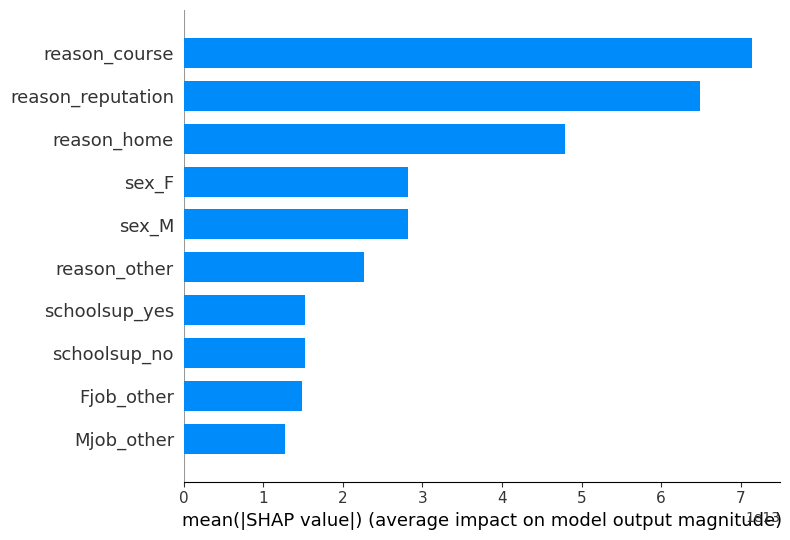

In [ ]:
shap.summary_plot(
    shap_values, features=X_test, feature_names=X.columns.values.tolist(), plot_type="bar", max_display=10)

[23:04:59] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


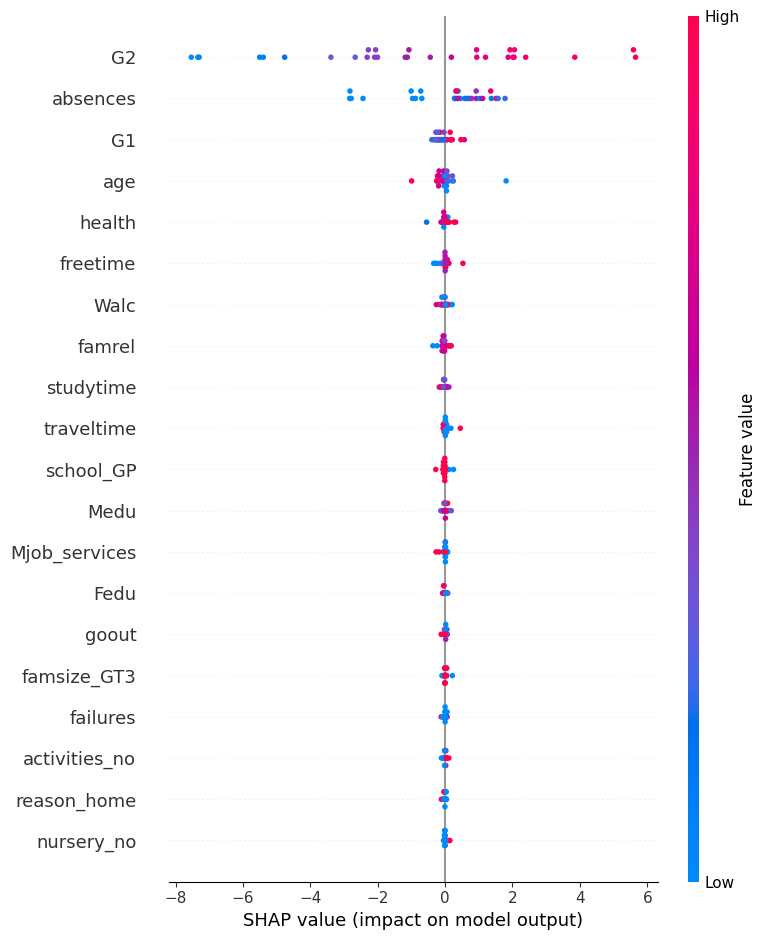

In [ ]:
# XGBRegressor
explainer_shap = shap.Explainer(model_xgb)
shap_values_xgb = explainer_shap.shap_values(X_test)
shap.summary_plot(shap_values_xgb, X_test)

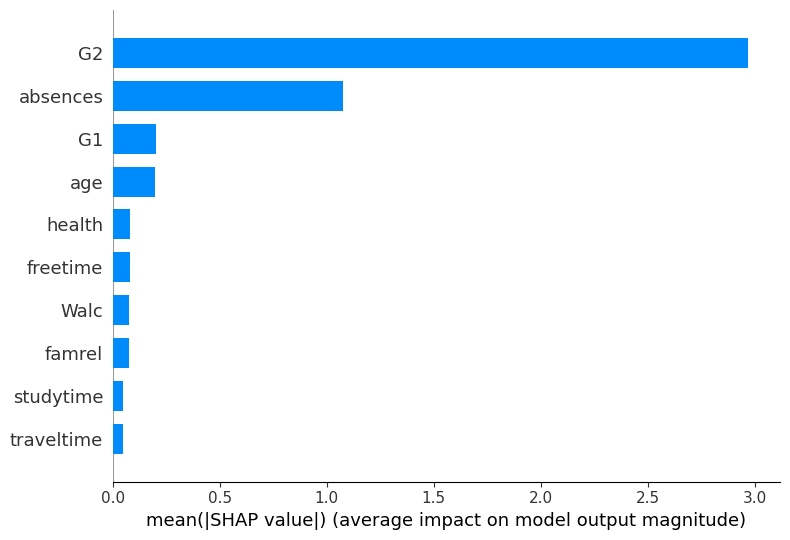

In [ ]:
shap.summary_plot(
    shap_values_xgb, features=X_test, feature_names=X.columns.values.tolist(), plot_type="bar", max_display=10)

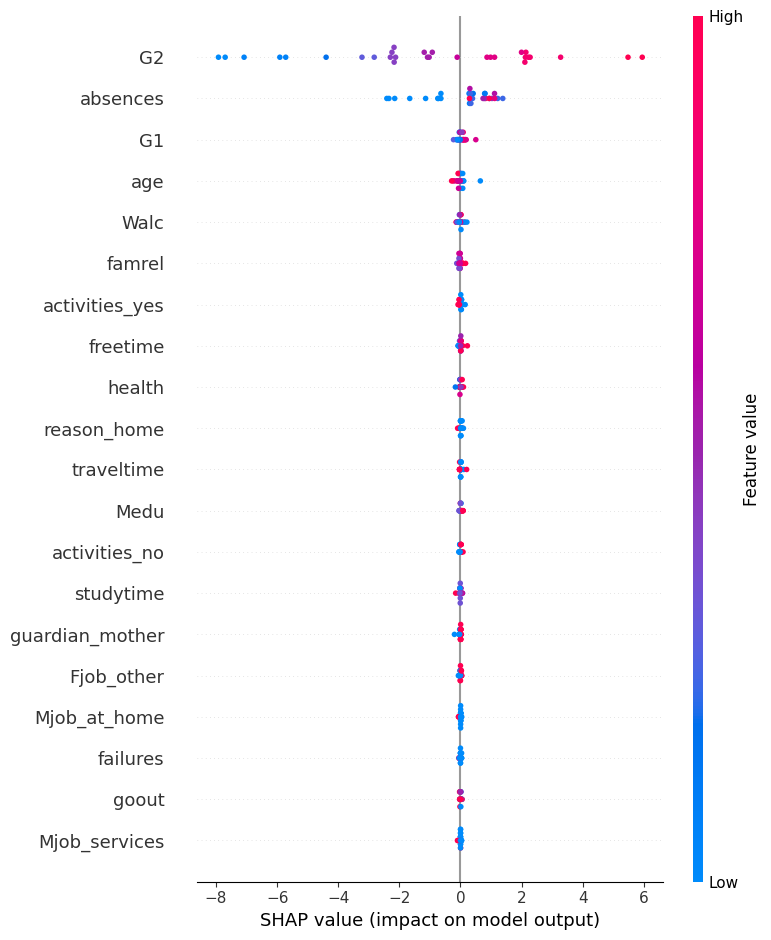

In [ ]:
# SVR - Modelo subrrogado RF
from sklearn.ensemble import RandomForestRegressor

surrogate_model = RandomForestRegressor(n_estimators=100, random_state=42)
surrogate_model.fit(X_train, y_train)

explainer_shap_svr = shap.TreeExplainer(surrogate_model)
shap_values_svr = explainer_shap_svr.shap_values(X_test)
shap.summary_plot(shap_values_svr, X_test)

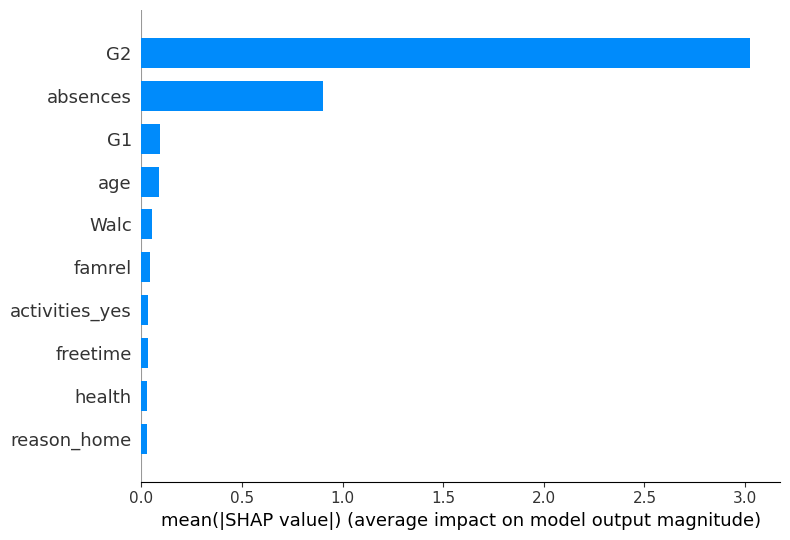

In [ ]:
shap.summary_plot(
    shap_values_svr, features=X_test, feature_names=X.columns.values.tolist(), plot_type="bar", max_display=10)

### Deep Learning (DL) ###

#### Model ####

1/1 [==============================] - 0s 79ms/step
Mean Squared Error (CNN): 4.476769937989006
R-squared (FNN): 0.7616062396195429
RMSE (FNN): 2.1158378808379923


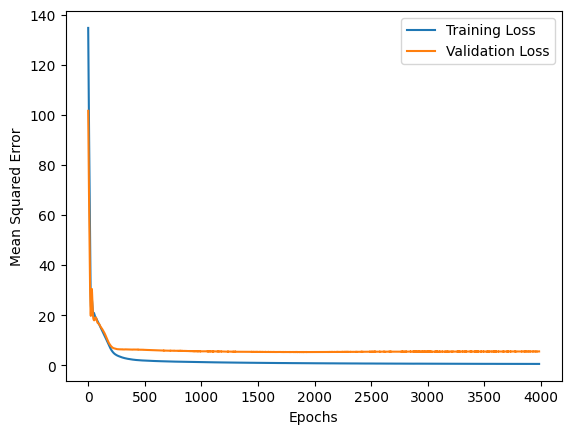

In [ ]:
# FNN
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import r2_score
from keras.callbacks import EarlyStopping
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from keras.regularizers import l2

# Definir y compilar el modelo
fnn_model = Sequential()
fnn_model.add(Dense(128, input_dim=X_train.shape[1], activation='relu', kernel_regularizer=l2(0.01)))
#fnn_model.add(BatchNormalization())
#fnn_model.add(Dropout(0.3))
fnn_model.add(Dense(64, activation='relu', kernel_regularizer=l2(0.01)))
#fnn_model.add(BatchNormalization())
#fnn_model.add(Dropout(0.3))
fnn_model.add(Dense(1, activation='linear', kernel_regularizer=l2(0.01)))
optimizer = Adam(lr=0.0001)
fnn_model.compile(optimizer=optimizer, loss='mean_squared_error')

# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2000, restore_best_weights=True)

# Entrenar el modelo - Con 30 bien
history = fnn_model.fit(X_train, y_train, epochs=20000, batch_size=1000, validation_data=(X_test, y_test), callbacks=[early_stopping], verbose=0)

# Evaluar
fnn_predictions = fnn_model.predict(X_test)
r2_fnn = r2_score(y_test, fnn_predictions)
mse_fnn = mean_squared_error(y_test, fnn_predictions)
print(f'Mean Squared Error (CNN): {mse_fnn}')
print(f'R-squared (FNN): {r2_fnn}')
print(f'RMSE (FNN): {np.sqrt(mse_fnn)}')

# Historial de entrenamiento
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()

1/1 [==============================] - 0s 78ms/step
Mean Squared Error (CNN): 2.8434415796733146
R-squared (CNN): 0.8485830766400815
RMSE (CNN): 1.6862507463818406


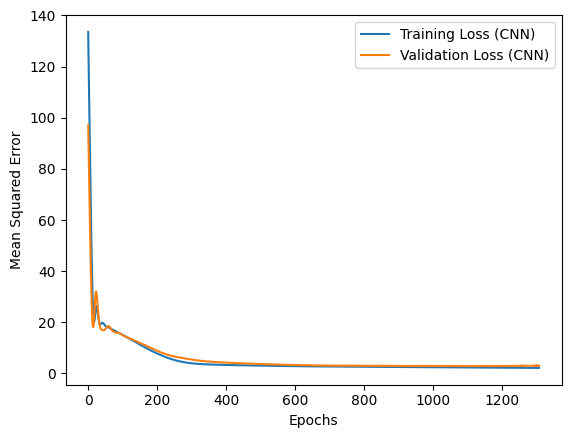

In [ ]:
# CNN
from keras.layers import Conv1D, Flatten, BatchNormalization, Dropout
from keras.optimizers import Adam

X_train_cnn = X_train.values.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test_cnn = X_test.values.reshape((X_test.shape[0], X_test.shape[1], 1))

# Definir y compilar el modelo
custom_optimizer = Adam(lr=0.01)
cnn_model = Sequential()
cnn_model.add(Conv1D(32, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
cnn_model.add(Flatten())
cnn_model.add(Dense(64, activation='relu'))
#cnn_model.add(Dropout(0.1))
cnn_model.add(Dense(1, activation='linear'))
cnn_model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

early_stopping = EarlyStopping(monitor='val_loss', patience=400, restore_best_weights=True) #70

# Entrenar el modelo #4000
history_cnn = cnn_model.fit(X_train_cnn, y_train, epochs=40000, batch_size=400, validation_data=(X_test_cnn, y_test), callbacks=[early_stopping], verbose=0)

# Evaluar
cnn_predictions = cnn_model.predict(X_test_cnn)
mse_cnn = mean_squared_error(y_test, cnn_predictions)
r2_cnn = r2_score(y_test, cnn_predictions)
print(f'Mean Squared Error (CNN): {mse_cnn}')
print(f'R-squared (CNN): {r2_cnn}')
print(f'RMSE (CNN): {np.sqrt(mse_cnn)}')

# Historial de entrenamiento
plt.plot(history_cnn.history['loss'], label='Training Loss (CNN)')
plt.plot(history_cnn.history['val_loss'], label='Validation Loss (CNN)')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()

1/1 [==============================] - 0s 443ms/step
Mean Squared Error (RNN): 3.0016282971732835
R-squared (RNN): 0.8401594303617563
RMSE (RNN): 1.73252079271023


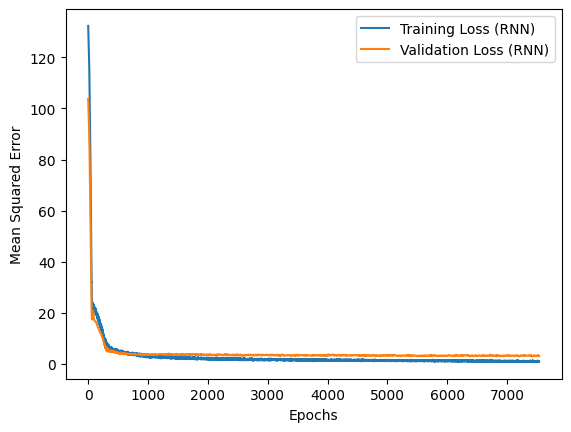

In [ ]:
# RNN
from keras.layers import LSTM, Dropout
from sklearn.metrics import r2_score
import lime
from lime import lime_tabular

# Formatear el dataset para pasarlo a 2D
X_train_rnn = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_rnn = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Definir y compilar el modelo
rnn_model = Sequential()
rnn_model.add(LSTM(32, activation='tanh', input_shape=(1, X_train.shape[1])))
rnn_model.add(Dropout(0.2))
rnn_model.add(Dense(64, activation='relu'))
rnn_model.add(Dropout(0.2))
rnn_model.add(Dense(1, activation='linear'))
rnn_model.compile(optimizer='adam', loss='mean_squared_error')

early_stopping = EarlyStopping(monitor='val_loss', patience=2000, restore_best_weights=True)

# Entrenar el modelo
history_rnn = rnn_model.fit(X_train_rnn, y_train, epochs=20000, batch_size=4000, validation_data=(X_test_rnn, y_test), callbacks = [early_stopping], verbose=0)

# Evaluar
rnn_predictions = rnn_model.predict(X_test_rnn)
mse_rnn = mean_squared_error(y_test, rnn_predictions)
r2_rnn = r2_score(y_test, rnn_predictions)
print(f'Mean Squared Error (RNN): {mse_rnn}')
print(f'R-squared (RNN): {r2_rnn}')
print(f'RMSE (RNN): {np.sqrt(mse_rnn)}')

# Historial de entrenamiento
plt.plot(history_rnn.history['loss'], label='Training Loss (RNN)')
plt.plot(history_rnn.history['val_loss'], label='Validation Loss (RNN)')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()

1/1 [==============================] - 0s 144ms/step
Mean Squared Error (Transformer): 3.4867084238294384
RMSE (Transformer): 1.867272991244033
R-squared (Transformer): 0.8143282893647421


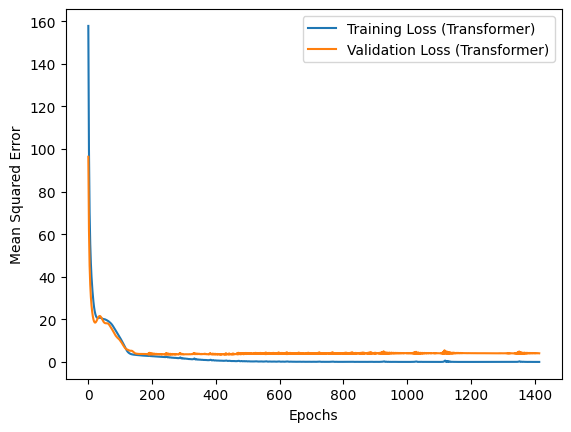

In [ ]:
from keras.models import Model
from keras.layers import Input, Dense, MultiHeadAttention, LayerNormalization, Reshape
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Función para construir el Transformer
def build_transformer_model(input_shape):
    inputs = Input(shape=input_shape)
    x = Reshape((1, input_shape[0]))(inputs)
    x = MultiHeadAttention(num_heads=8, key_dim=16)(x, x)
    x = LayerNormalization(epsilon=1e-6)(x)
    x = Dense(64, activation='relu')(x)
    outputs = Dense(1, activation='linear')(x)

    model = Model(inputs=inputs, outputs=outputs)
    optimizer = Adam(lr=0.001)
    model.compile(optimizer=optimizer, loss='mean_squared_error')

    return model

# Asumimos que input_shape es de la mismas forma que las características (X_train.shape[1:])
input_shape = (X_train.shape[1],)

# Construir y compilar el modelo
transformer_model = build_transformer_model(input_shape)

early_stopping = EarlyStopping(monitor='val_loss', patience=1000, restore_best_weights=True)

# Entrenar
history_transformer = transformer_model.fit(X_train, y_train, epochs=10000, batch_size=3000, validation_data=(X_test, y_test), callbacks=[early_stopping], verbose=0)

# Evaluar el modelo
transformer_predictions = transformer_model.predict(X_test)
transformer_predictions = transformer_predictions.ravel() if len(transformer_predictions.shape) > 1 else transformer_predictions
mse_transformer = mean_squared_error(y_test, transformer_predictions)
r2_transformer = r2_score(y_test, transformer_predictions)
print(f'Mean Squared Error (Transformer): {mse_transformer}')
print(f'RMSE (Transformer): {np.sqrt(mse_transformer)}')
print(f'R-squared (Transformer): {r2_transformer}')

# Plot training history for Transformer
plt.plot(history_transformer.history['loss'], label='Training Loss (Transformer)')
plt.plot(history_transformer.history['val_loss'], label='Validation Loss (Transformer)')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()


#### Interpretation ####

##### LIME #####

In [ ]:
# FNN
explainer_fnn = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', training_labels=y_train.values, feature_names=X.columns.values.tolist())
exp_fnn = explainer_fnn.explain_instance(X_test.iloc[0].values, fnn_model.predict)
print("LIME Explanation (FNN):")
print(exp_fnn.show_in_notebook())

157/157 [==============================] - 0s 2ms/step
LIME Explanation (FNN):


None


En este caso, LIME nos indica que las características que mas contribuyen son G2, G1 y SER SEXO MASCULINO, mientras que el
TRABABAJO DEL PADRE (SECTOR SANITARIO) son las que menos.

In [ ]:
# CNN
def cnn_predict(inputs):
    inputs_reshaped = inputs.reshape((inputs.shape[0], inputs.shape[1], 1))
    return cnn_model.predict(inputs_reshaped)

# Interpretar con LIME
explainer_cnn = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', training_labels=y_train.values, feature_names=X.columns.values.tolist())

# Definimos una función
def predict_function(inputs):
    return cnn_predict(inputs)

# Explicar el resultado con LIME
exp_cnn = explainer_cnn.explain_instance(X_test.iloc[0].values, predict_function)

# Mostrar el resultado
print("LIME Explanation (CNN):")
print(exp_cnn.show_in_notebook())

157/157 [==============================] - 1s 3ms/step
LIME Explanation (CNN):


None


En este caso, LIME nos indica que las características que mas contribuyen son G2, ESCUELA y SER SEXO MASCULINO, mientras que el
TRABABAJO DEL PADRE (SECTOR SANITARIO) son las que menos.

In [ ]:
# RNN
def rnn_predict(samples):
    # Reshape
    samples_reshaped = samples.reshape((samples.shape[0], 1, samples.shape[1]))
    # Predecir
    predictions = rnn_model.predict(samples_reshaped)
    # Devolver predicciones
    return predictions

# Aplanar X_train
X_train_rnn_flat = X_train_rnn.reshape((X_train_rnn.shape[0], X_train_rnn.shape[2]))

# Crear LimeTabularExplainer
lime_explainer_rnn = lime_tabular.LimeTabularExplainer(X_train_rnn_flat, mode='regression', training_labels=y_train.values, feature_names=X.columns.values.tolist(), discretize_continuous=False)

# Escoger un elemento
sample_index = 0
sample = X_test_rnn[sample_index]

# Obtener la explicación
explanation_rnn = lime_explainer_rnn.explain_instance(sample.flatten(), rnn_predict, num_features=X_train_rnn.shape[2])

# Mostrar
print(explanation_rnn.show_in_notebook())

157/157 [==============================] - 0s 2ms/step


None


En este caso, LIME nos indica que las características que mas contribuyen son G1, G2 y ABSENTISMO, mientras que el
TRABABAJO DEL PADRE (SECTOR OTROS), NO TENGA ENFERMERÍA EL COLEGIO y TAMAÑO DE FAMILIA (< 3) son las que menos.

In [ ]:
# TRANSFORMER
def predict_transformer(data):
    # Verificar el reshape
    if data.ndim == 3:
        # Extraer datos
        data_sequence = data[:, 0, :]
    else:
        # Reshape
        data_reshaped = data.reshape((data.shape[0], 1, data.shape[1]))
        # Extrar datos
        data_sequence = data_reshaped[:, 0, :]

    # Hacer predicciones
    predictions = transformer_model.predict(data_sequence)
    return predictions.ravel()

# Crear LIME
explainer_transformer = lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', training_labels=y_train.values, feature_names=X.columns.values.tolist())

# Mostrar
exp_transformer = explainer_transformer.explain_instance(X_test.iloc[0].values, predict_transformer)
print("LIME Explanation (TRANSFORMER):")
print(exp_transformer.show_in_notebook())

157/157 [==============================] - 1s 2ms/step
LIME Explanation (TRANSFORMER):


None


En este caso, LIME nos indica que las características que mas contribuyen son G2, TRABAJO DE LA MADRE y TAMAÑO DE LA FAMILIAR, mientras que el
TAMAÑO DE LA FAMILIA es la que menos.

##### SHAP #####

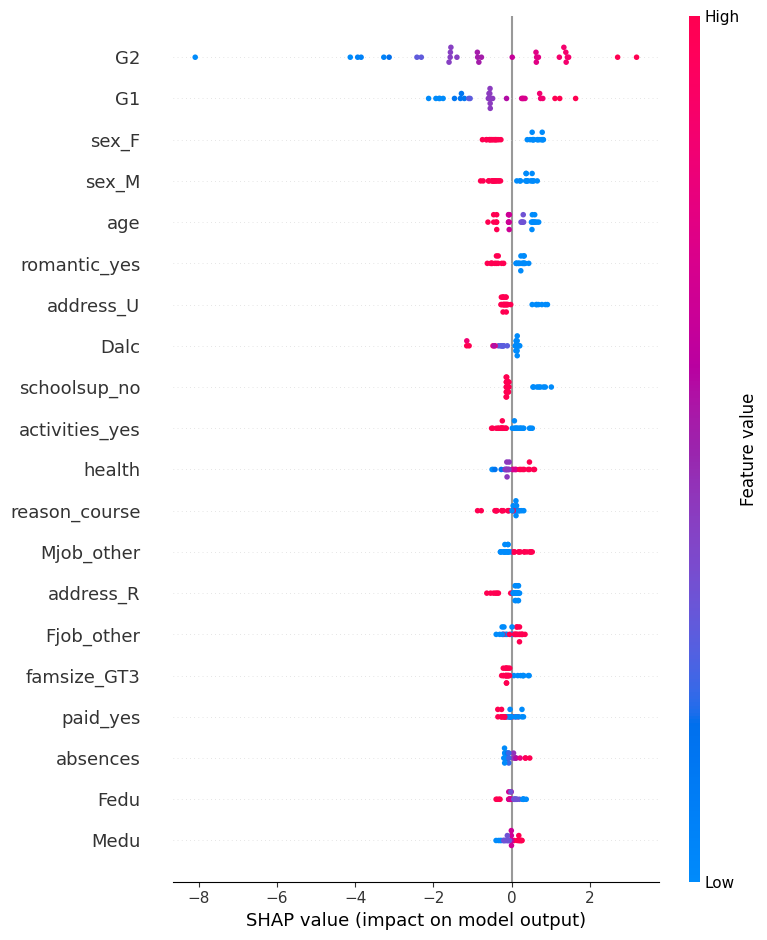

In [ ]:
# FNN
# Interpretar el modelo con SHAP
explainer_shap_fnn = shap.Explainer(fnn_model, X_train.values)  # Usar X_train para el masker
shap_values_fnn = explainer_shap_fnn.shap_values(X_test.values)

# Mostrar la información
shap.summary_plot(shap_values_fnn, X_test)

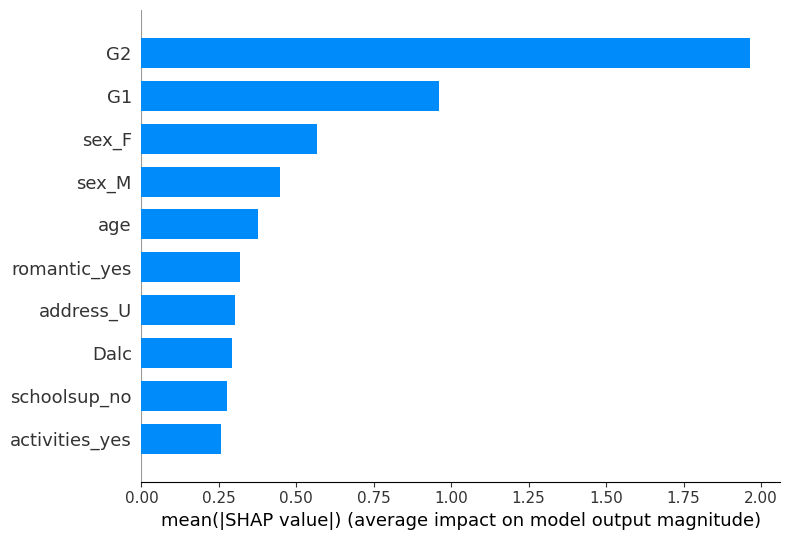

In [ ]:
shap.summary_plot(
    shap_values_fnn, features=X_test, feature_names=X.columns.values.tolist(), plot_type="bar", max_display=10)

PermutationExplainer explainer: 31it [00:16,  1.11s/it]


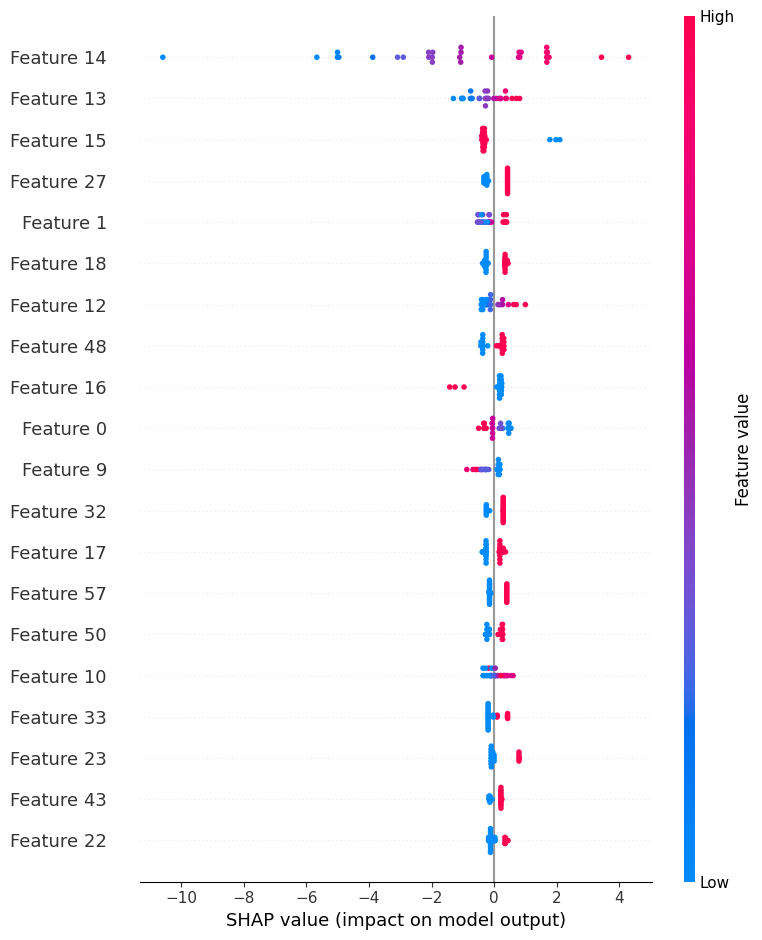

ValueError: ignored

In [ ]:
# CNN
# Reshape the training data to match the expected shape (58,)
X_train_reshaped = X_train.values.reshape(X_train.values.shape[0], -1)

# Create a SHAP explainer without specifying a masker
explainer_shap_cnn = shap.Explainer(cnn_model, X_train_reshaped)

# Get SHAP values for the entire test set
shap_values_cnn = explainer_shap_cnn.shap_values(X_test_cnn.reshape(X_test_cnn.shape[0], -1))

# Display the summary plot
shap.summary_plot(shap_values_cnn, X_test_cnn.reshape(X_test_cnn.shape[0], -1))

# Example of using a specific sample index for the force plot
sample_index = 0
shap.force_plot(explainer_shap_cnn.feature_names, shap_values_cnn[0][sample_index], X_test_cnn[sample_index].reshape(-1), link="identity")


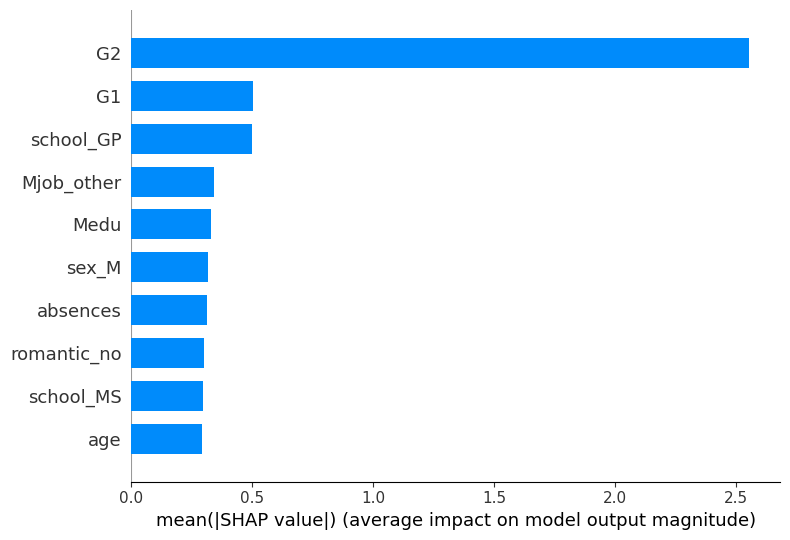

In [ ]:
shap.summary_plot(
    shap_values_cnn, features=X_test, feature_names=X.columns.values.tolist(), plot_type="bar", max_display=10)

In [ ]:
# RNN
# Reshape the training data to match the expected shape (None, 1, 58)
X_train_rnn_reshaped = X_train.values.reshape(X_train.values.shape[0], 1, -1)

# Create a SHAP explainer without specifying a masker
explainer_shap_rnn = shap.Explainer(rnn_model, X_train_rnn_reshaped)

# Get SHAP values for the entire test set
shap_values_rnn = explainer_shap_rnn.shap_values(X_test_rnn.reshape(X_test_rnn.shape[0], 1, -1))

# Display the summary plot
shap.summary_plot(shap_values_rnn, X_test_rnn.reshape(X_test_rnn.shape[0], 1, -1))

# Example of using a specific sample index for the force plot
sample_index = 0
shap.force_plot(explainer_shap_rnn.expected_value[0], shap_values_rnn[0][sample_index], X_test_rnn[sample_index].reshape(1, -1), link="identity")


TypeError: ignored

PermutationExplainer explainer: 31it [00:10,  3.52s/it]


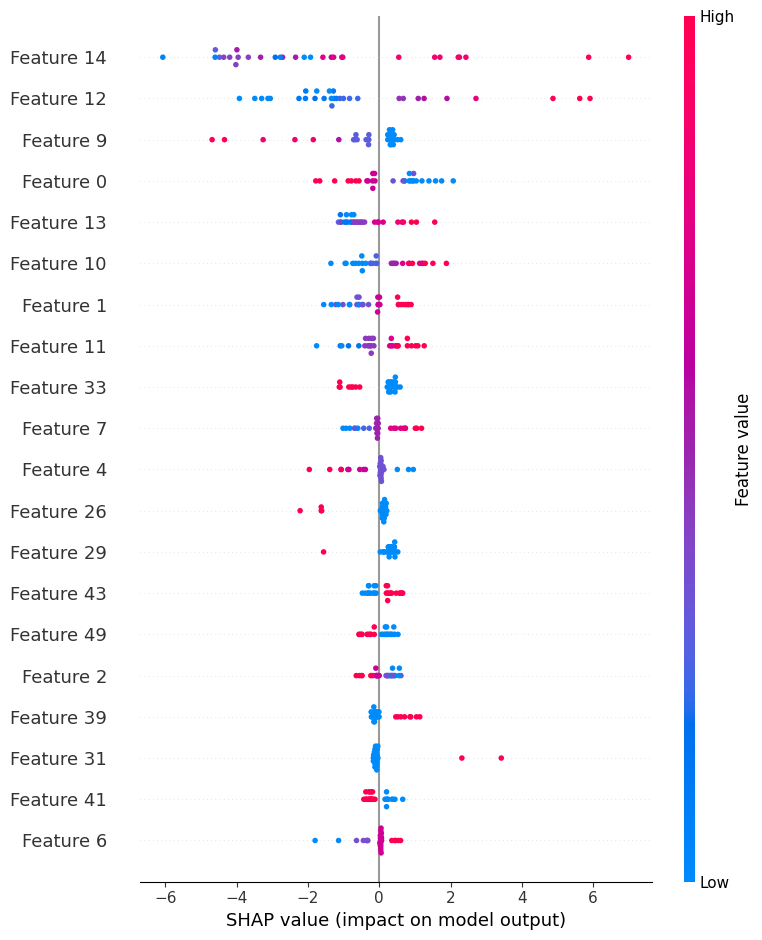

In [ ]:
#TRANSFORMER
from sklearn.preprocessing import StandardScaler

# Preprocesar los datos
scaler = StandardScaler()
X_train_transformer = scaler.fit_transform(X_train)
X_test_transformer = scaler.transform(X_test)

# Crear un objeto Explainer
explainer_transformer = shap.Explainer(transformer_model, X_train_transformer)

# Obtener los valores SHAP para el conjunto de prueba
shap_values_transformer = explainer_transformer.shap_values(X_test_transformer)

# Mostrar el gráfico de resumen
shap.summary_plot(shap_values_transformer, X_test_transformer)

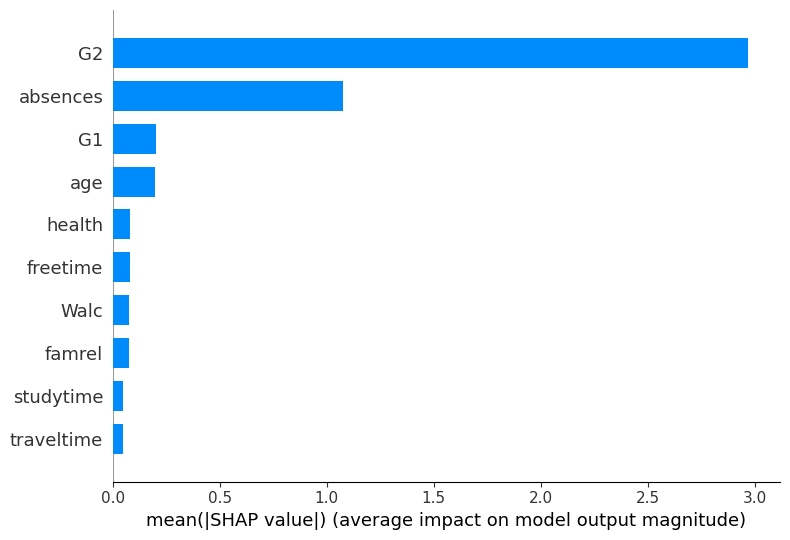

In [ ]:
shap.summary_plot(
    shap_values_transformer, features=X_test, feature_names=X.columns.values.tolist(), plot_type="bar", max_display=10)